# NOAA GOES Satellite Data

author: camen  
last run: Nov 17, 2019

In [1]:
import datetime
from IPython.display import Image
import pkg_resources
import tempfile

import boto3
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import netCDF4
import numpy as np
from tqdm import tqdm
import xarray as xr

## Introduction

This notebook is meant to serve as an introduction to the NOAA GOES-R level 1b publicly-available dataset in Amazon S3. We will attempt to explain the data format, and a few ways to work with it, as well as provide some additional places to read more documentation. We hope it helps!

## Running This Notebook

1. `pip install -r requirements.txt` 
    - Make sure the package requirements are installed in the environment of your choice
    - For added convenience see the dependecy versions used in this notebook printed below
2. Set up local credentials for `boto3`
    - We will interact with Amazon S3 with [boto3](https://boto3.amazonaws.com/v1/documentation/api/latest/index.html), which requires AWS credentials. `boto3` searches for these in various ways, the easiest (and suggested) is to create a ~/.aws/credentials file and store your credentials there. Both `boto3` and the `awscli` look here for AWS credentials. If you do not want to do that, you can also export the environment variables `AWS_ACCESS_KEY_ID` and `AWS_SECRET_ACCESS_KEY`. Refer to https://boto3.amazonaws.com/v1/documentation/api/latest/guide/configuration.html#configuring-credentials for more information on configuration. 


In [2]:
for pkg_of_interest in ["boto3", "matplotlib", "netcdf4", "numpy", "tqdm", "xarray"]:
    print(pkg_resources.working_set.by_key.get(pkg_of_interest))

boto3 1.10.19
matplotlib 3.1.1
netCDF4 1.5.3
numpy 1.17.4
tqdm 4.38.0
xarray 0.14.0


## Contents

- [What's Available?](#What's-Available%3F)
- [Published Documentation](#Published-Documentation)
- [GOES-16 vs. GOES-17](#GOES-16-vs.-GOES-17)
- [ABI Level 1b Data](#ABI-Level-1b-Data)
    - [Accessing](#Accessing)
    - [Data Format](#Data-Format)
        - [What is Radiance?](#What-is-Radiance%3F)
        - [Meta Data](#Meta-Data)
    - [Processing](#Processing)
        - [Channels Preview](#Channels-Preview)
        - [Reflective Channels](#Reflective-Channels)
        - [Emissive Channels](#Emissive-Channels)
        - [Resolution](#Resolution)
        - [Data Quality Flags](#Data-Quality-Flags)
        - [ABI Fixed Grid](#ABI-Fixed-Grid)
    - [Time Lapse](#Time-Lapse)

## What's Available?

The Geostationary Operational Environmental Satellites (GOES), operated by NOAA, provide visibile and infrared imagery of the Earth, lightning mapping, space weather monitoring, and solar imaging. Specifically, the GOES-16 and GOES-17 satellites are used broadly for weather imaging and to this aim NOAA releases data from these two satellites publicly on Amazon S3 (see [here](https://docs.opendata.aws/noaa-goes16/cics-readme.html) for some information on accessing the GOES-16 data). 

The data released is from the [Advanced Baseline Imager](https://www.goes-r.gov/spacesegment/abi.html) (ABI) on the satellites, which views the Earth with 16 different spectral bands (wavelengths of light) specifically chosen for imaging different aspects of the Earth's surface, oceans, and atmosphere. We go into more detail about these 16 bands and other key information (such as temporal and spatial resolution) later in this notebook.

The data from the ABI instrument on both satellites is available in 2 main forms differentiated by the level of processing:
    1. Level 1b contain spectral radiance data that have been calibrated radiometrically and geometrically
    2. Level 2 contain environment physical quantities like cloud top height, land surface temperature, hurricane intensity
    
Additionally, the data are differentiated by its spatial region and scan mode. We won't really get too into scan mode (except for how it affects the frequency of scans), but there are four regions:
    1. Full Hemisphere (F)
    2. Continental US (CONUS -- C)
    3. Mesoscale 1 (M1)
    4. Mesoscale 2 (M2)
    
In this notebook we will be describing the Level 1b processed ABI data, but you can read more about Level 2 in section 7.3 [here](https://www.goes-r.gov/users/docs/PUG-main-vol1.pdf) which is a brief overview or in more detail [in this document](https://www.goes-r.gov/products/docs/PUG-L2+-vol5.pdf).

**Tl;dr**  
NOAA offers data for imaging the Earth's surfact, oceans, and atmosphere on Amazon S3 from 2 satellites, 2 levels of processing and 4 regions ([GOES-16](https://s3.console.aws.amazon.com/s3/buckets/noaa-goes16/?region=us-west-2&tab=overview), [GOES-17](https://s3.console.aws.amazon.com/s3/buckets/noaa-goes17/?region=us-west-2&tab=overview)), and in this notebook we will be focusing on the ABI Level 1b Radiance package produced by the GOES-17 satellite.

## Published Documentation

- https://www.nesdis.noaa.gov/GOES-R-Series-Satellites
- https://www.goes-r.gov/users/docs/PUG-GRB-vol4.pdf
- https://www.goes-r.gov/products/docs/PUG-Appendix-X.pdf
- https://docs.opendata.aws/noaa-goes16/cics-readme.html
- https://www.star.nesdis.noaa.gov/goesr/docs/ATBD/Imagery.pdf
- https://www.goes-r.gov/users/docs/PUG-GRB-vol4.pdf
- https://www.ncdc.noaa.gov/sites/default/files/attachments/README_ABI-L1b-CMI_Provisional_Maturity.pdf
- https://www.goes-r.gov/users/docs/PUG-main-vol1.pdf
- https://www.goes-r.gov/users/docs/PUG-L1b-vol3.pdf
- https://www.goes-r.gov/users/transitionToOperations17.html

## GOES-16 vs. GOES-17

There aren't many differences in the scanning capabilities. GOES-16 is positioned in the GOES East orbit (covering the eastern half of the US), and GOES-17 is positioned in the GOES West orbit (covering the western half of the US) and has now replaced the GOES-15 satellite. Alternate names for the GOES-16 and GOES-17 satellites are GOES-East and GOES-West, respectively.

## ABI Level 1b Data

The GOES-16 and GOES-17 satellites are both outfitted with the Advanced Baseline Imager, from which we get channel-specific of various regions of the Earth. 

The `Level 1b` is documenting that the data has gone through some processing before arriving in this form. To further explain, it is useful to briefly go through the process. The satellite sends CCSDS packets of the raw data in a very compressed form to the ground stations. Then it goes through the `Level 0` algorithm which somewhat decompresses it and extracts the raw detector observations and calibration data. The Level 1b algorithm fully decompresses the Level 0 data, radiometrically corrects it, and resamples the radiometrically corrected sample data to the ABI fixed grid. The ABI fixed grid is a set of static pixel locations centered on the sub-satellite point in order to aid users by providing continuity in the locations of geographic features throughout the mission life.

We get scans organized by time started, channel of light, and region in this form. There is also another set of processing through the `Level 2` algorithm.

### Accessing

NOAA maintains 2 Amazon S3 buckets, [one](https://s3.console.aws.amazon.com/s3/buckets/noaa-goes16/?region=us-west-2&tab=overview) for Level 1b and Level 2 ABI data from GOES-16 and [another](https://s3.console.aws.amazon.com/s3/buckets/noaa-goes17/?region=us-west-2&tab=overview) for the same data but from GOES-17.

The directory structure of the two buckets are identical, differing only in the final filenames of the files (the filename includes specific dates indicating the scan start time, end time, and create time). 

An example key is:

`ABI-L1b-RadM/2019/300/20/OR_ABI-L1b-RadM1-M6C07_G17_s20193002010275_e20193002010344_c20193002010380.nc`,

which can be parsed thus:

- `ABI-`: name of the instrument, this is constant among all files in the bucket
- `L1b-`: level of processing, this is constant for the Level 1b data
- `Rad`: data type, this is constant for the Level 1b data
- `M/`: region, either "C" (CONUS), "M" (Mesoscale), or "F" (Full)
- `2019/`: scan year
- `300/`: scan day of year (001 - 365)
- `20/`: scan hour (00 - 23)
- `OR_`: real time data, this is constant
- `ABI-`: name of instrument again, this is constant
- `L1b-`: level of processing again, this is constant
- `Rad`: data type again, this is constant
- `M1-`: region, either "C" (CONUS), "M1" (Mesoscale 1), "M2" (Mesoscale 2), or "F" (Full)
- `M6`: scan mode, dependent on scan date, either mode 3, 4 or 6
    - mode 6 was turned on April 2, 2019 15:00 UTC
- `C07_`: channel number (C01 - C16)
- `G17_`: satellite, dependent on S3 bucket, either G16 or G17
- `s20193002010275_`: scan start datetime (%Y%j%H%M%S%f)
- `e20193002010344_`: scan end datetime (%Y%j%H%M%S%f)
- `c20193002010380`: file created datetime (%Y%j%H%M%S%f)
- `.nc`: netCDF4 file

Under the directory `ABI-L1b-RadM/2019/300/20/` there will be all scans for each channel (1 - 16) taken on the 20th hour of the 300th day of the 2019 year.

**Tl;dr**  
- [GOES-16 S3 Bucket (noaa-goes16)](https://s3.console.aws.amazon.com/s3/buckets/noaa-goes16/?region=us-west-2&tab=overview)
- [GOES-17 S3 Bucket (noaa-goes17)](https://s3.console.aws.amazon.com/s3/buckets/noaa-goes17/?region=us-west-2&tab=overview)

In [3]:
def download_to_xarray(s3_bucket, s3_key):
    s3 = boto3.client("s3")
    
    with tempfile.NamedTemporaryFile() as temp_file:
        s3.download_file(Bucket=s3_bucket, Key=s3_key, Filename=temp_file.name)
        datastore = xr.open_dataset(temp_file.name)
        
    return datastore

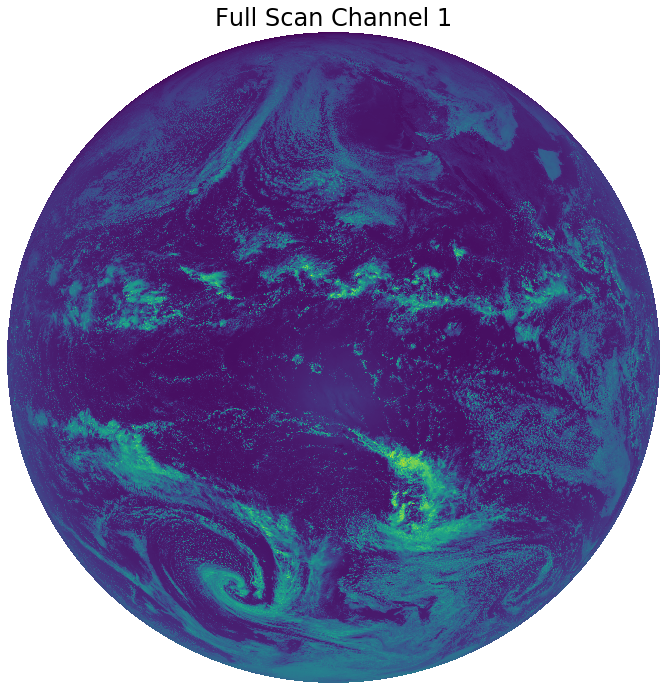

In [4]:
band_1 = download_to_xarray(
    s3_bucket="noaa-goes17", 
    s3_key="ABI-L1b-RadF/2019/300/20/OR_ABI-L1b-RadF-M6C01_G17_s20193002040341_e20193002049408_c20193002049465.nc"
)

_, ax = plt.subplots(figsize=(12, 12))
ax.imshow(band_1.Rad)
ax.set_title("Full Scan Channel 1", fontsize=24)
ax.axis("off");

### Data Format

The data is provided in [netCDF4](https://www.unidata.ucar.edu/software/netcdf/docs/netcdf_introduction.html) format, which is an abstraction that supports a view of multi-dimensional data as a collection of self-describing objects. Taking advantage of this data structure each scan can contain a large amount of information (the Python port uses NumPy arrays in the backend), and also a large amount of documentation.

Each netCDF4 file in Amazon S3 is data from a single scan over a single channel (spectral band). The central variable in the netCDF is `Rad` for the spectral radiance, which has coordinates `(x, y, t)`. 

The main library for interacting with netCDF4 files are [netCDF4](https://www.unidata.ucar.edu/software/netcdf/docs/netcdf_introduction.html) and [xarray](http://xarray.pydata.org/en/stable/), the latter being a powerful wrapper of the former because of its support for high dimensionm labelled data. 

Below, we will explain the key aspects of this data structure.

In [27]:
band_1

<xarray.Dataset>
Dimensions:                                           (band: 1, num_star_looks: 24, number_of_image_bounds: 2, number_of_time_bounds: 2, x: 10848, y: 10848)
Coordinates:
    t                                                 datetime64[ns] ...
  * y                                                 (y) float32 0.151858 ... -0.151858
  * x                                                 (x) float32 -0.151858 ... 0.151858
    y_image                                           float32 ...
    x_image                                           float32 ...
    band_id                                           (band) int8 ...
    band_wavelength                                   (band) float32 ...
    t_star_look                                       (num_star_looks) datetime64[ns] ...
    band_wavelength_star_look                         (num_star_looks) float32 ...
Dimensions without coordinates: band, num_star_looks, number_of_image_bounds, number_of_time_bounds
Data variables

As you can see above, there is a TON of information in the file, but let's start with its main component, `Rad`.

#### What is Radiance?

Radiance, here, is short for spectral radience which is radiance emitted, reflected, or transmitted over a surface per wavelength of light (watt per square meter per steradian per mm or watt per square meter per steradian per reciprocal cm) and it is primarily used to measure reflectance or emission of electromagnetic radiation. 

That last part was the useful part, in that the GOES-16/17 ABI Level 1b data has 16 channels of light, the first six being the reflective channels, and the remaining 10 being the emissive channels. So, radiance gives us a common unit to measure both the reflective and the emissive channels, and so it is useful for data structure standardization, but what we we really care about are metrics specific to the type of channel. 

For the reflective channels (1 - 6), we want to transform radiance into something called _reflectance factor_, and for the emissive channels (7 - 14) we want to transform radiance into _brightness temperature_. Since netCDFs prize self-documentation, the variables needed to make this transformation are both included and documented in the file, which is awesome!

**Tl;dr**  
Radiance is a common measurement across the 16 channels, but we want to transform it into _reflectance factor_ (channels 1 - 6) or _brightness temperature_ (channels 7 - 16) depending on the channel.

In [6]:
band_1.Rad

<xarray.DataArray 'Rad' (y: 10848, x: 10848)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    t        datetime64[ns] ...
  * y        (y) float32 0.151858 0.15183 0.151802 ... -0.15182999 -0.151858
  * x        (x) float32 -0.151858 -0.15183 -0.151802 ... 0.15182999 0.151858
    y_image  float32 ...
    x_image  float32 ...
Attributes:
    long_name:              ABI L1b Radiances
    standard_name:          toa_outgoing_radiance_per_unit_wavelength
    sensor_band_bit_depth:  10
    valid_range:            [   0 1022]
    units:                  W m-2 sr-1 um-1
    resolution:             y: 0.000028 rad x: 0.000028 rad
    grid_mapping:           goes_imager_projection
    cell_methods:           t: point area: point
    ancil

#### Meta Data

There's a ton of meta data, making strong use of the netCDF4 file format, here are some useful ones

In [7]:
# units
# band_1.Rad.units
# band_1.x.units
# band_1.y.units

# channel
# band_1.band_id.data

# documentation of variables used for transformations
# band_1.kappa0.long_name                                           
# band_1.planck_fk1.long_name                                        
# band_1.planck_fk2.long_name                                        
# band_1.planck_bc1.long_name                                     
# band_1.planck_bc2.long_name

# meta scan info
# band_1.time_coverage_start
# band_1.time_coverage_end

### Processing

For consistency the Level 1b product provides the [radiance](https://en.wikipedia.org/wiki/Radiance) for all channels. However, depending on the channel, it is best to understand the data in either [reflectance factor](https://en.wikipedia.org/wiki/Reflectance) or [brightness temperature](https://en.wikipedia.org/wiki/Brightness_temperature). We translate the spectral radiance in channels 1 - 6 to reflectance factor, and channels 7 - 16 to brightness temperature. 

To ease the user in this transformation the Level 1b product provides the necessary constants. 

In [8]:
def rad_to_reflectance_factor(ds):
    return ds.Rad * ds.kappa0


def rad_to_brightness_temperature(ds):
    return (ds.planck_fk2 / (np.log((ds.planck_fk1 / ds.Rad) + 1)) - ds.planck_bc1) / ds.planck_bc2

#### Channels Preview

In [9]:
def plot_channels(s3_filter):
    fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(20, 40))

    channels = np.arange(1, 17)
    for channel, ax in zip(tqdm(channels), np.ravel(axes)):
        filter_key = s3_filter.format(
            channel=str(channel).zfill(2)
        )

        s3 = boto3.resource("s3")
        first_scan_in_hour = list(
            s3.Bucket("noaa-goes17")
            .objects
            .filter(Prefix=filter_key)
        )[0]

        ds = download_to_xarray(
            s3_bucket=first_scan_in_hour.bucket_name, 
            s3_key=first_scan_in_hour.key
        )
        if ds.band_id.data[0] < 7:
            ax.imshow(rad_to_reflectance_factor(ds), animated=True)
            ax.set_title(f"Channel {channel} Reflectance Factor", fontsize=16)

        else:
            ax.imshow(rad_to_brightness_temperature(ds), animated=True)
            ax.set_title(f"Channel {channel} Brightness Temperature", fontsize=16)

    for ax in np.ravel(axes):
        ax.axis("off")
        
    date = datetime.datetime.strptime(ds.time_coverage_start, "%Y-%m-%dT%H:%M:%S.%fZ")
    fig.suptitle(f"{date:%B %d, %Y at %I:%M %p} UTC", fontsize=20, y=1.02)
    plt.tight_layout();

100%|██████████| 16/16 [00:30<00:00,  1.92s/it]


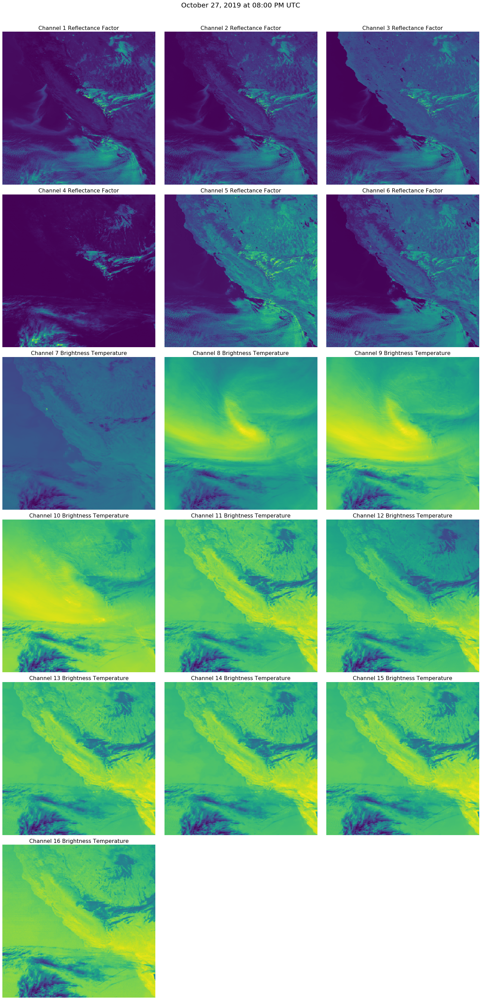

In [10]:
plot_channels(s3_filter="ABI-L1b-RadM/2019/300/20/OR_ABI-L1b-RadM1-M6C{channel}_G17_")

#### Reflective Channels

Channels 1 - 6 are the reflective bands measured in reflectance factor.

To get reflectance factor from spectral radiance we use the formula: $\rho f = L_v \times \kappa $, where $\rho f$ is reflectance factor, $L_v$ is the spectral radiance, and $\kappa$ is the incident Lambertian equivalent radiance. (see pages 27 and 28 of [PUG volume 3](https://www.goes-r.gov/users/docs/PUG-L1b-vol3.pdf))

In [11]:
# we'll use the GOES-16 bucket for the channel 1 data 
# and GOES-17 for the channel 7 data 
# just to see how processing is the same
band_1 = download_to_xarray(
    s3_bucket="noaa-goes16", 
    s3_key="ABI-L1b-RadF/2019/195/20/OR_ABI-L1b-RadF-M6C01_G16_s20191952030375_e20191952040083_c20191952040135.nc"
)

In [12]:
band_1.kappa0.long_name

'Inverse of the incoming top of atmosphere radiance at current earth-sun distance (PI d2 esun-1)-1, where d is the ratio of instantaneous Earth-Sun distance divided by the mean Earth-Sun distance, esun is the bandpass-weighted solar irradiance and PI is a standard constant used to convert ABI L1b radiance to reflectance'

#### Emissive Channels

Channels 7 - 16 above are the emissive bands measured in brightess temperature.

To get brightness temperature from spectral radiance we use the formula: T = [ fk2 / (log((fk1 / Lλ) + 1)) - bc1 ] / bc2, where $T$ is the brightness temperature, fk1 and fk2 are coefficients of the Planck function derived from physical constants (i.e., the speed
of light, the Boltzmann constant, and the Planck constant) and the bandpass central wavenumber, and bc1
and bc2 are the spectral response function offset and scale correction terms. (see page 28 of [PUG volume 3](https://www.goes-r.gov/users/docs/PUG-L1b-vol3.pdf))

In [13]:
band_7 = download_to_xarray(
    s3_bucket="noaa-goes17",  
    s3_key="ABI-L1b-RadM/2019/300/20/OR_ABI-L1b-RadM1-M6C07_G17_s20193002010275_e20193002010344_c20193002010380.nc"
)

In [14]:
band_7.planck_bc1.long_name

'spectral bandpass correction offset for brightness temperature (B(nu) - bc_1)/bc_2 where B()=planck_function() and nu=wavenumber'

In [15]:
band_7.planck_bc2.long_name

'spectral bandpass correction scale factor for brightness temperature (B(nu) - bc_1)/bc_2 where B()=planck_function() and nu=wavenumber'

In [16]:
band_7.planck_fk1.long_name

'wavenumber-dependent coefficient (2 h c2/ nu3) used in the ABI emissive band monochromatic brightness temperature computation, where nu =central wavenumber and h and c are standard constants'

In [17]:
band_7.planck_fk2.long_name

'wavenumber-dependent coefficient (h c nu/b) used in the ABI emissive band monochromatic brightness temperature computation, where nu = central wavenumber and h, c, and b are standard constants'

#### Resolution

- the different channels have different resolutions
    - channels 1, 3, and 5 are 1 km 
    - channel 2 is 0.5km
    - all other channels are 2km

#### Data Quality Flags

- For every pixel radiance the Level 1b data also provides a data quality flag (DQF) ranging from 0 (good) to 3 (no value). They recommend only using pixels with a DQF of 0 or 1, but this could change depending on context. 

#### ABI Fixed Grid

The ABI fixed grid is a set of static pixel locations centered on the sub-satellite point in order to aid users by providing continuity in the locations of geographic features throughout the mission life. It is possible to get the latitude-longitude coordinates from this fixed grid (see [PUG volume 4 section 7.1.2.6](https://www.goes-r.gov/users/docs/PUG-GRB-vol4.pdf)).

### Time Lapse

In [18]:
s3_filter = "ABI-L1b-RadM/{year}/{day_of_year}/{hour}/OR_ABI-L1b-RadM1-M6C{channel}_G17_"

def get_some_scans(date, channel):
    scans = []
    for hour in tqdm(range(24)):
        filter_key = s3_filter.format(
            year=date.year,
            day_of_year=date.strftime("%j"),
            hour=str(hour).zfill(2),
            channel=str(channel).zfill(2)
        )

        s3 = boto3.resource("s3")
        first_scan_in_hour = list(
            s3.Bucket("noaa-goes17")
            .objects
            .filter(Prefix=filter_key)
        )[0]
        
        ds = download_to_xarray(
            s3_bucket=first_scan_in_hour.bucket_name, 
            s3_key=first_scan_in_hour.key
        )
        if ds.band_id.data[0] < 7:
            image = plt.imshow(rad_to_reflectance_factor(ds), animated=True)
    
        else:
            image = plt.imshow(rad_to_brightness_temperature(ds), animated=True)
            
        scans.append(image)
    return scans

100%|██████████| 24/24 [00:37<00:00,  1.56s/it]


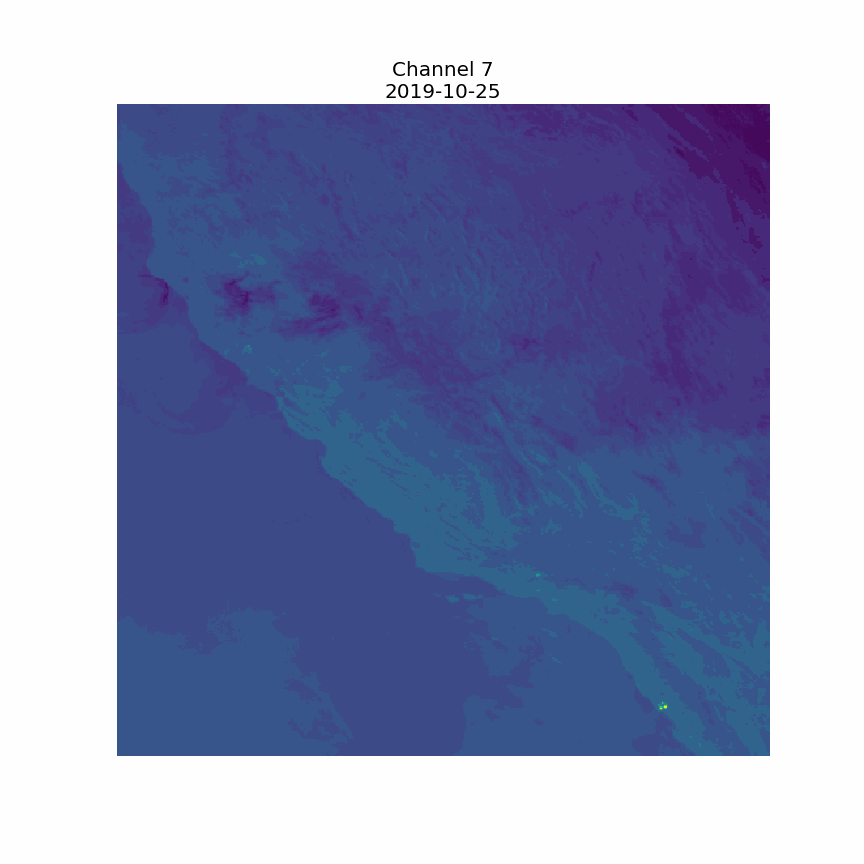

In [19]:
fig, ax = plt.subplots(figsize=(12, 12))

date = datetime.date(2019, 10, 25)
channel = 7

anim = animation.ArtistAnimation(
    fig, 
    artists=np.expand_dims(get_some_scans(date, channel), axis=1)
)
ax.axis("off")
ax.set_title(f"Channel {channel}\n{date}", fontsize=20)
plt.close();

# we don't want to require ffmpeg, so we do this work around
filepath = f"noaa_goes17_{date}_C{str(channel).zfill(2)}.gif"
anim.save(filename=filepath, writer=animation.PillowWriter(fps=5))
with open(filepath,"rb") as buff:
    display(Image(data=buff.read(), format="gif"))